## Github Setup
If not already present this clones the repo into google colab so that I may work on it with a bash environment.

In [0]:
!git config --global user.name "Richard Boyne"
!git config --global user.email "boynerichard@yahoo.co.uk"

In [0]:
from getpass import getpass
import os

if not os.path.isdir(".git"):
    user = "Boyne272"
    password = getpass('github password')
    os.environ['GITHUB_AUTH'] = user + ':' + password

    # clone the repo
    !git clone https://$GITHUB_AUTH@github.com/msc-acse/acse-9-independent-research-project-Boyne272.git repo

    # move the repo up one
    !mv repo/.git .
    !git checkout kmeans
    !git reset --hard
    
if os.path.isdir("sample_data"):
    !rm -r sample_data/
    
if os.path.isdir("repo"):    
    !rm -r repo
    
!ls -la

github password··········
Cloning into 'repo'...
remote: Enumerating objects: 71, done.
remote: Counting objects: 100% (71/71), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 71 (delta 29), reused 42 (delta 14), pack-reused 0
Unpacking objects: 100% (71/71), done.
D	.gitignore
D	Peliminary Report Richard Boyne.pdf
D	README.md
D	Thin_Sections_Workspace.ipynb
D	images/TX1_polarised_cropped.tif
D	images/TX1_white_cropped.tif
D	kmeans/kmeans_basic.py
D	kmeans/kmeans_examples.ipynb
D	kmeans/kmeans_img.py
D	kmeans/kmeans_local.py
D	kmeans/kmeans_local_failed.py
D	kmeans/test_kmeans_basic.py
D	kmeans/test_kmeans_img.py
D	kmeans/test_kmeans_local.py
D	kmeans/test_kmeans_local_failed.py
D	kmeans/tools.py
Branch 'kmeans' set up to track remote branch 'kmeans' from 'origin'.
Switched to a new branch 'kmeans'
HEAD is now at 50d535a brief description of current repository state
total 8424
drwxr-xr-x 1 root root    4096 Jul 12 07:18  .
drwxr-xr-x 1 root root    4096 Jul 12 07:1

## Github Space
Use the cells here to run github commands

In [0]:
!git show --summary

commit 50d535ac941054890c18a68bec8867d14cf60b50 (HEAD -> kmeans, origin/master, origin/kmeans, origin/HEAD, master)
Author: Richard Boyne <31725818+Boyne272@users.noreply.github.com>
Date:   Thu Jul 11 14:32:40 2019 +0200

    brief description of current repository state
    
    Mostly for myself so that I remeber where everything is



In [0]:
!mv tmp.txt kmeans/MSLIC.py

In [16]:
!git status

On branch kmeans
Your branch is up to date with 'origin/kmeans'.

nothing to commit, working tree clean


In [0]:
!git add kmeans/MSLIC.py

In [14]:
!git commit -m "minor bug fix to MSLIC" -m "forgot to import slic"

[kmeans 810d020] minor bug fix to MSLIC
 1 file changed, 1 insertion(+), 1 deletion(-)


In [15]:
!git push origin kmeans

Counting objects: 4, done.
Delta compression using up to 2 threads.
Compressing objects: 100% (4/4), done.
Writing objects: 100% (4/4), 411 bytes | 411.00 KiB/s, done.
Total 4 (delta 3), reused 0 (delta 0)
remote: Resolving deltas: 100% (3/3), completed with 3 local objects.
To https://github.com/msc-acse/acse-9-independent-research-project-Boyne272.git
   3d6c0c5..810d020  kmeans -> kmeans


## Manual Testing
Pytest test code to run all locatable tests. Note that Each test is inself a unittest so can bedone by running each test file indevidually aswell.

In [0]:
!py.test

============================= test session starts ==============================
platform linux2 -- Python 2.7.15+, pytest-3.6.4, py-1.8.0, pluggy-0.7.1
rootdir: /content, inifile:
collected 9 items                                                              

kmeans/test_kmeans_basic.py .                                            [ 11%]
kmeans/test_kmeans_img.py ..                                             [ 33%]
kmeans/test_kmeans_local.py ...                                          [ 66%]
kmeans/test_kmeans_local_failed.py ...                                   [100%]

========================== 9 passed in 18.28 seconds ===========================


## Imports

In [0]:
# Ipython magic functions
%load_ext autoreload
%autoreload 2
%matplotlib inline

# add paths to look for local modules
import sys
sys.path.insert(0, "/content/kmeans")

# imports
import torch
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sig
from tools import set_seed, get_img, progress_bar

## Development Space

Progress |###################################################| 53.3550 s

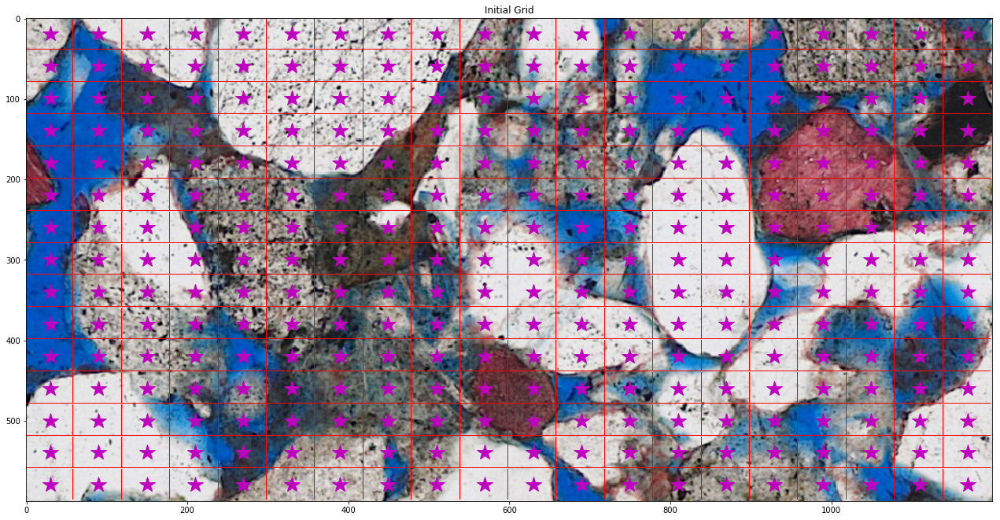

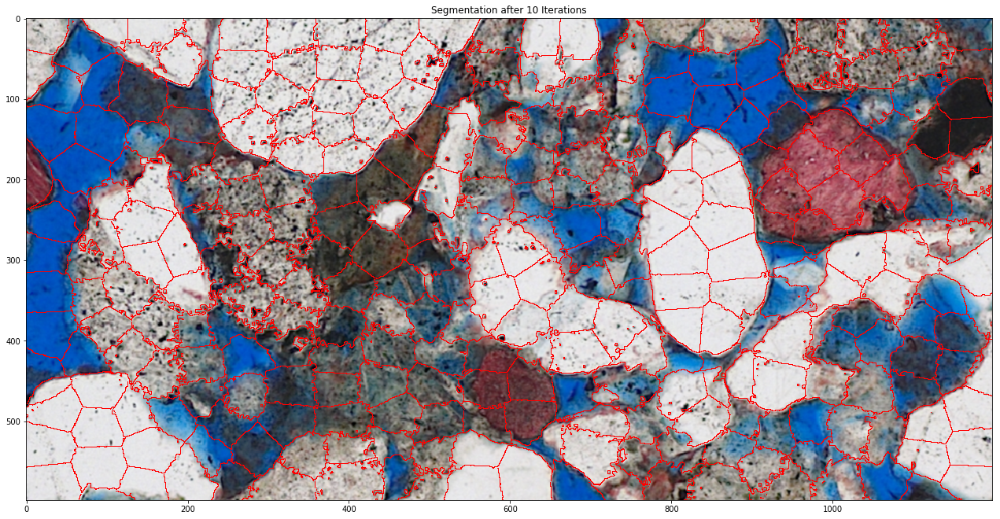

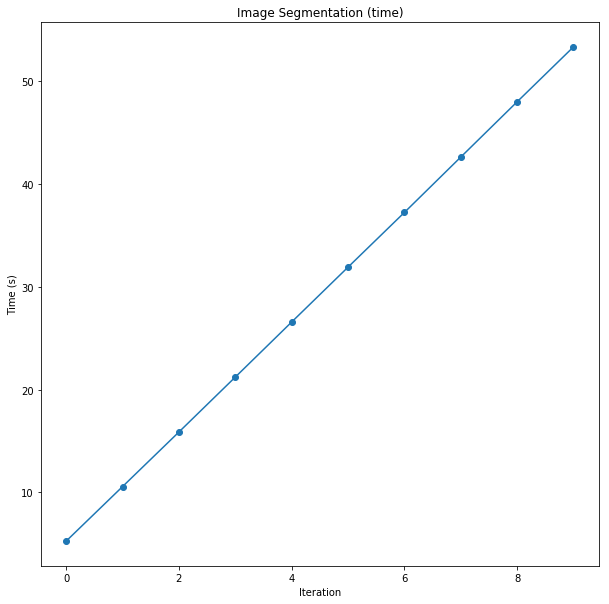

In [0]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sig
from tools import set_seed, get_img, progress_bar


class img_base():
    """
    The base needed to convert a image array into a 5d vector
    """
    
    def __init__(self, img, **kwargs):
        "setup the img and vectors"
        
        assert img.ndim == 3, "image must be a 3d array"
        assert img.shape[-1] == 3, "image must be of form (x ,y, rgb)"
        
        self.dim_y, self.dim_x = img.shape[:2]

        self.Np = self.dim_x * self.dim_y      # the number of pixels
        self.vectors = self.img_to_vectors(img)
        self.img = img
        
    
    def img_to_vectors(self, img):
        """
        Convert 3d image array (x, y, rgb) into an array of 5d vectors
        (x, y, r, g, b)"
        """
        
        # the x and y cordinates
        X, Y = np.meshgrid(range(self.dim_x),
                           range(self.dim_y))
        
        # create the 5d vectors
        vecs = np.zeros([self.Np, 5])
        vecs[:, 0] = X.ravel()
        vecs[:, 1] = Y.ravel()
        vecs[:, 2] = img[:, :, 0].ravel()
        vecs[:, 3] = img[:, :, 1].ravel()
        vecs[:, 4] = img[:, :, 2].ravel()
        
        return torch.from_numpy(vecs).float()
    
    
    def tensor_to_mask(self, tensor):
        "Reshape a tensor of values into the original image shape"
        return tensor.view(self.dim_y, self.dim_x).cpu().numpy()
    
    
    def mask_aplha_values(self, mask, color='r'):
        "Take a 2d mask and return a 3d rgba mask for imshow overlaying"
        
        assert type(mask) == type(np.array([])), "mask must be a numpy array"
        assert mask.ndim == 2, "mask must be a 2d array"
        
        zeros = np.zeros_like(mask)
        
        rgba = np.dstack([zeros, zeros, zeros, mask])
        
        if color == 'r':
            rgba[:, :, 0] = mask
        elif color == 'g':
            rgba[:, :, 1] = mask
        elif color == 'b':
            rgba[:, :, 2] = mask
            
        return rgba
    
    
    def outline(self, mask):
        """
        Take a 2d mask and use a laplacian convolution to find the segment 
        outlines
        """
        
        assert type(mask) == type(np.array([])), "mask must be a numpy array"
        assert mask.ndim == 2, "mask must be a 2d array"
        
        laplacian = np.ones([3, 3])
        laplacian[1, 1] = -8
        edges = sig.convolve2d(mask, laplacian, mode='valid')
        edges = (edges > 0).astype(float)
        
        return edges
        
        

class bin_base():
    """
    The base needed to bin vectors into a given grid
    """
    
    def __init__(self, bin_grid, **kwargs):
        "Setup the image grid with binned pixels into"
        
        assert len(bin_grid) == 2, "bin grid must be 2d"
        assert type(bin_grid[0]) == int, "grid must be integers"
        
        self.Nx, self.Ny = bin_grid # number of bin divisions in x and y
        self.Nk = self.Nx * self.Ny # number of k means centroids
        
        self.bin_dx = self.dim_x / self.Nx  # size of bins in x
        self.bin_dy = self.dim_y / self.Ny  # size of bins in y
        
        assert self.bin_dx == int(self.bin_dx), \
            "Must be evenly divisible in the x axis"
        assert self.bin_dy == int(self.bin_dy), \
            "Must be evenly divisible in the y axis"
        
        self.adj_bins = self.find_adjasent_bins() # create adjasent bins list
        
        
    def bin_vectors(self, vecs):
        """
        Bin vectors with cordinates (x, y, . . .) into the grid
        """
        x_bins = (vecs[:, 0] / self.bin_dx).floor()
        y_bins = (vecs[:, 1] / self.bin_dy).floor()
        output = y_bins * self.Nx + x_bins
        return output.long()
    
    
    def find_adjasent_bins(self):
        """
        Create a list of which bins are adjasent to which bins
        """
        adj_bins = [] 
        for i in range(self.Nk):
            # find the cordinates of each bin in the bin grid
            x, y = self.index_to_cords(i)
            # find the neightbours of that cordinate
            cordinates = self.neighbours(x, y, self.Nx, self.Ny)
            # convert the cordinates back into an index
            indexs = [ self.cords_to_index(x_, y_) for x_,y_ in cordinates ]
            # store the indexs in tensor form
            adj_bins.append(torch.tensor(indexs))
        return adj_bins
    
    
    def neighbours(self, x, y, x_max, y_max, r=1):
        """
        Find the neighbours in radius r to the x and y cordinate
        (this includes itself as a neighbour)
        """
        return [(x_, y_) for x_ in range(x-r, x+r+1)
                         for y_ in range(y-r, y+r+1)
                         if (#(x != x_ or y != y_) and   # not the center
                             (0 <= x_ < x_max) and # not outside x range
                             (0 <= y_ < y_max))]   # not outside y range
    
    
    def index_to_cords (self, i):
        return i%self.Nx, int(i/self.Nx)
    
    def cords_to_index(self, x, y):
        return y * self.Nx + x
       
        
        
class distance_metrics():
    """
    This holds all the different distance metric choices. Each function
    find the distance between every vector pair in two rank two tensors
    """
    
    def __init__(self, choice, **kwargs):
        
        if choice == 'normal':
            self.distance = self.distance_normal
            
        elif choice == 'default':
            self.distance = self.distance_scaled
            if 'factor' in kwargs.keys():
                self.factor = kwargs['factor']
            else:
                self.factor = 1
            
        elif choice == 'custom':
            if 'dist_func' in kwargs.keys():
                self.distance = kwargs['dist_func']
            else:
                raise(ValueError)
        
        else:
            raise(ValueError)
    
    
    def distance_normal(self, vecs, clusts):
        """
        Find the distance between every vector and every cluster
        vecs and clusts are 2 rank tensors with samples on the first dimension
        returns a rank 2 tensor with samples on the first dimension and distance
        to each cluster on the second
        """
        displacement = clusts - vecs[:, None]
        return displacement.norm(dim=2)

    
    def distance_scaled(self, vecs, clusts):
        """
        Find the distance between every vector and every cluster
        vecs and clusts are 2 rank tensors with samples on the first dimension
        returns a rank 2 tensor with samples on the first dimension and distance
        to each cluster on the second
        """
        col_clust, col_vec = clusts[:, 2:], vecs[:, 2:]
        pos_clust, pos_vec = clusts[:, :2], vecs[:, :2]
        
        col_dist = (col_clust - col_vec[:, None]).norm(dim=2)
        pos_dist = (pos_clust - pos_vec[:, None]).norm(dim=2)

        return col_dist + pos_dist * self.factor / np.sqrt(self.Np / self.Nk)
    
    

class SLIC(img_base, bin_base, distance_metrics):
    """
    Implements Kmeans clustering on an image in 5d color position space
    using localised bins on a regular grid to enforce locality.
    """
    
    def __init__(self, img, bin_grid, dist_metric='default', **kwargs):
        """
        Parameters
        ----------
        
        img : 3d numpy array
            Image to be segmented by kmeans,
            expected in shape [x_dim, y_dim, rgb] with all values in the
            interval [0, 1], not 255.
            
        bin_grid : tuple length 2
            The number of initial partitions in x and y respectivly,
            therefore the number of segments is the product of these. 
            Both must be a factor of the x, y dimensions for the whole
            image. This intial segmentation restrains the kmeans centers
            in space, forcing locality of segments and speeding up the
            algorithm.
            
        dist_metric : string, optional
            Choose the of calculating distance between two vectors:
            - 'normal' finds the normal distance without scaling either
                position or color space
            - 'default' finds the normal distance with scaling the position
                space by the bin widths. Can also pass the kwarg 'factor'
                with an additional scaling factor for the position space.
            - 'custom' pass a fucntion to be used in the kwarg 'dist_func'
        """
        
        # validate the kwargs
        valid_args = ['factor']
        for key in kwargs.keys():
            assert key in valid_args, "kwarg " + key + " was not recognised"
        
        # setup the image, bin_grid and distance metric base classes
        img_base.__init__(self, img, **kwargs)
        bin_base.__init__(self, bin_grid, **kwargs)
        distance_metrics.__init__(self, dist_metric, **kwargs)
        
        # which bin each vector belongs to
        self.vec_bins_tensor = self.bin_vectors(self.vectors)
        
        # which vectors are in each bin
        self.vec_bins_list = [(self.vec_bins_tensor==i).nonzero().squeeze()
                              for i in range(self.Nk)]
        
        # which cluster each vector belongs to
        self.cluster_tensor = self.vec_bins_tensor.clone()
        
        # which vectors are in each cluster
        self.cluster_list = [(self.cluster_tensor==i).nonzero().squeeze()
                             for i in range(self.Nk)]
        
        # initialise the centroids
        self.centroids = torch.empty([self.Nk, 5], dtype=torch.float)
        self.update_centroids()
        
        # stores the distances between vectors and local centroids
        self.vc_dists = []
        
        
    def update_centroids(self):
        """
        Find the new center of each cluster as the mean of its constituent
        elemtens
        """
        for i in range(self.Nk):
            vecs_in_cluster = self.cluster_list[i]
            assert vecs_in_cluster.numel() > 0, 'no cluser should be empty'
            self.centroids[i] = self.vectors[vecs_in_cluster].mean(dim=0)
            
            
    def update_distances(self):
        """
        Find the ditance between every vector in a bin and every centroid
        in that or the neighbouring bins.
        """
        
        # bin the centroids
        cent_bins_tensor = self.bin_vectors(self.centroids)
        
        # reset the distances
        self.vc_dists = []
        
        # for every bin grid (same as number of centroids)
        for i in range(self.Nk):
            
            # relevant centroids and vectors
            centroids_to_search = self.adj_bins[i]
            vecs_in_bin = self.vec_bins_list[i]
        
            # find distance between vectors in this bin and local centroids
            vecs_tensors = self.vectors[vecs_in_bin]
            cents_tensors = self.centroids[centroids_to_search]
            dist = self.distance(vecs_tensors, cents_tensors) 
            self.vc_dists.append(dist)
            
            
    def update_clusters(self):
        """
        Find which vectors belong to which cluster by taking the mimunum of
        the distances.
        """
        
        # for every bin grid (same as number of centroids)
        for i in range(self.Nk):
            
            # relevant centroids and vectors
            vecs_in_bin = self.vec_bins_list[i]
            centroids_to_search = self.adj_bins[i]
            
            # find which centroids are the closest and update them
            min_indexs = torch.argmin(self.vc_dists[i], dim=1)
            min_clusters = centroids_to_search[min_indexs]
            self.cluster_tensor[vecs_in_bin] = min_clusters
        
        # re-allocate which vectors are in each cluster
        for i in range(self.Nk):
            self.cluster_list[i] = (self.cluster_tensor==i).nonzero().squeeze()     
    
    
    def iterate(self, n_iter):
        "loop for n_iter iterations with progress bar"
        
        # create the progress bar
        self.progress_bar = progress_bar(n_iter)
    
        for i in range(n_iter):
            self.update_distances()
            self.update_clusters()
            self.update_centroids()
            self.progress_bar(i)


    def plot(self, option='default', ax=None, path=None, figsize=[22,22]):
        """
        Plot a one fo the following options on an axis if specified:
            - 'default' image and the segement outlines
            - 'setup' image, bin edges and cluster centers
            - 'segments' the sedment mask
            - 'edges' just the segment outlines in a transparent manner
            - 'img' just the orinal image
            - 'centers' each kmean centroid
            - 'bin_edges' the bin mesh used
            - 'bins' both 'img' and 'bin_edges'
            - 'time' the iterations vs time if iterate was called
            
        If path is given the image will be saved on that path.
        
        If no axis is given one can give a figsize wanted.
        """
        
        # validate opiton
        valid_ops = ['default', 'setup', 'edges', 'img', 'centers', 'bins', 'time',
                     'bin_edges', 'segments', 'setup']
        assert option in valid_ops, "option not recoginsed"
        
        # create an axis if not given
        if ax == None:
            fig, ax = plt.subplots(figsize=figsize)
            
        if option == 'default':
            self.plot('img', ax)
            self.plot('edges', ax)
            ax.set(title='Image Segmentation (default)')
        
        elif option == 'setup':
            self.plot('img', ax)
            self.plot('bin_edges', ax)
            self.plot('centers', ax)
            ax.set(title='Image Segmentation (setup)')
        
        elif option == 'segments':
            mask = self.tensor_to_mask(self.cluster_tensor)
            ax.imshow(mask)
            ax.set(title='Image Segmentation (segments)')
        
        elif option == 'edges':
            mask = self.tensor_to_mask(self.cluster_tensor)
            mask = self.outline(mask)
            mask = self.mask_aplha_values(mask)
            ax.imshow(mask)
            ax.set(title='Image Segmentation (edges)')
            
        elif option == 'img':
            ax.imshow(self.img)
            ax.set(title='Image Segmentation (img)')
            
        elif option == 'centers':
            ax.plot(self.centroids[:, 0].cpu().numpy(),
                    self.centroids[:, 1].cpu().numpy(), 'm*', ms=20)
            ax.set(title='Image Segmentation (centers)')

        elif option == 'bin_edges':
            mask = self.tensor_to_mask(self.vec_bins_tensor)
            mask = self.outline(mask)
            mask = self.mask_aplha_values(mask)
            ax.imshow(mask)
            ax.set(title='Image Segmentation (bin_edges)')
            
        elif option == 'bins':
            mask = self.tensor_to_mask(self.vec_bins_tensor)
            ax.imshow(mask)
            ax.set(title='Image Segmentation (bins)')
            
        elif option == 'time':
            assert hasattr(self, 'progress_bar'), 'must call iterate to use this'
            self.progress_bar.plot_time(ax)
            ax.set(title='Image Segmentation (time)')
            
        # save the figure if wanted
        if path:
            plt.savefig(path)
            
            
            
if __name__ == '__main__':
    # run an example
    
    # setup
    set_seed(10)
    img = get_img("images/TX1_white_cropped.tif")
    obj = SLIC(img, [20,15])

    # plot the initial binning 
    obj.plot("setup")
    plt.gca().set(title='Initial Grid')
    
    # iterate
    obj.iterate(10)
    
    # plot the resulting segmentation
    obj.plot('default')
    plt.gca().set(title='Segmentation after 10 Iterations')
    
    # plot the time taken
    obj.plot('time', figsize=[10, 10])

In [0]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from kmeans_local import kmeans_local
from tools import set_seed, get_img, progress_bar


class MSLIC_wrapper():

    def __init__(self, imgs, bin_grid, combo_metric='max',
                 dist_metric='default', **kwargs):
        """
        Wrapper around SLIC to run multiple instances at once, using a the
        combined of each instance to assign clusters in every iteration
        
        Parameters
        ----------
        
        imgs : list of 3d numpy arrays
            The imgs on which the SLIC algorithm is to be run in parallel. 
            Each must have the same shape and have a 
            
        bin_grid : tuple length 2 (same as SLIC)
            The number of initial partitions in x and y respectivly,
            therefore the number of segments is the product of these. 
            Both must be a factor of the x, y dimensions for the whole
            image. This intial segmentation restrains the kmeans centers
            in space, forcing locality of segments and speeding up the
            algorithm.
            
        combo_metric : string, optional
            The metric by which the distances between vectors and centroids
            in each image are to be combined. Allowed options are:
            - 'max' maximum of the distances in each image
            - 'min' minimum of the distances in each image
            - 'mean' average of the distances in each image
            - 'sum' total of the distances in each image
            - 'custom' custom function must be passed as 'metric_func' kwarg
                which takes a 3d tensor of distances with shape
                (image, vector, cluster) and returns a 2d tensor of distances
                with shape (vector, cluster)

        dist_metric : string, optional (same as SLIC)
            Choose the of calculating distance between two vectors:
            - 'normal' finds the normal distance without scaling either
                position or color space
            - 'default' finds the normal distance with scaling the position
                space by the bin widths. Can also pass the kwarg 'factor'
                with an additional scaling factor for the position space.
            - 'custom' pass a fucntion to be used in the kwarg 'dist_func'
            
        kwargs : optional
            Other than those described above for combo_metric and dist_metric
            these are passed into the SLIC objects, refer to it's documentaiton.
        """
        
        # validate all given images
        for img in imgs:
            assert img.shape == imgs[0].shape, "images must be the same shape"
        
        # create the SLIC objects
        self.SLIC_objs = [SLIC(img, bin_grid, dist_metric, **kwargs)
                          for img in imgs]
        
        # set the combine metric
        if combo_metric == 'max':
            self.metric = lambda t:t.max(dim=0)[0]

        elif combo_metric == 'min':
            self.metric = lambda t:t.min(dim=0)[0]

        elif combo_metric == 'mean':
            self.metric = lambda t:t.mean(dim=0)

        elif combo_metric == 'sum':
            self.metric = lambda t:t.sum(dim=0)
            
        elif combo_metric == 'custom':
            assert 'metric_func' in kwargs.keys(), \
                "Must pass 'metric_func' as key word argument"
            self.metric = metric_func
        
        else:
            assert False, "metric " + combo_metric + " not recognised"
                
    
    def combined_distance(self):
        "Find the combined distance for every pixel using the specified metric"
        
        # reset the distances
        self.combo_dist = []
        
        # for all distance values in every bin
        all_distances = [obj.vc_dists for obj in self.SLIC_objs]
        for dists in zip(*all_distances):
            
            # calculate the combined distance using the distance metric
            dist_tensor = torch.stack(dists)
            self.combo_dist.append(self.metric(dist_tensor))
    
            
    def iterate(self, n_iter):
        "loop for n_iter iterations with progress bar"
        
        # create the progress bar and store on each of the objects
        self.progress_bar = progress_bar(n_iter)
        for obj in self.SLIC_objs:
            obj.progress_bar = self.progress_bar
        
        for i in range(n_iter):
            
            # iterate up to finding distances for each kmeans object
            for obj in self.SLIC_objs:
                obj.update_distances()
                
            # find the combined distance
            self.combined_distance()
            
            # finish the iteration for each SLIC
            for n, obj in enumerate(self.SLIC_objs):
                
                # set the combined distance
                obj.vc_dists = self.combo_dist
                
                # only calculate the new clusters once
                if n == 0:
                    obj.update_clusters()
                else:
                    obj.cluster_tensor = self.SLIC_objs[0].cluster_tensor
                    obj.cluster_list = self.SLIC_objs[0].cluster_list
                    
                # update the centroid means
                obj.update_centroids()
            
            # print the progress bar
            self.progress_bar(i)
    
    
    def plot(self, obj_indexs, option='default', axs=None):
        """
        Calls obj.plot() on each of the SLIC objects given with option
        
        Parameters
        ----------
        
        obj_indexs : list of ints
            which of the given objects to be plotted
            
        option : string, optional
            the plot option to be passed to obj.plot, refer to the docstrings
            there for available options 
            
        axs : tuple of matplotlib axis, optional
            the axis to be plotted on, if not given a subplot for each of
            the SLIC objs is used
        """
        
        # set the axis if not given
        if not axs:
            N = len(obj_indexs)
            fig, axs = plt.subplots(N, 1, figsize=[N*22, 22])
            axs = np.array([axs]).ravel() # force it be an array even if N = 1
            
        # call the plot routenes
        for i, ax in zip(obj_indexs, axs):
            self.SLIC_objs[i].plot(option, ax=ax)
            
            
if __name__ == '__main__':
    set_seed(10)

    grid = [40, 40]

    img_white = get_img("images/TX1_white_cropped.tif")
    obj_white = kmeans_local(img_white, grid)

    img_polar = get_img("images/TX1_polarised_cropped.tif")
    obj_polar = kmeans_local(img_polar, grid)

    # plot the initial binning 
    obj_white.plot("setup")
    plt.gca().set(title='Initial Grid')

    multi_obj = MSLIC_wrapper([obj_white, obj_polar])

    # iterate
    multi_obj.iterate(2)
    
    # plot
    multi_obj.plot([0,1])
    

## Testing Space

Progress |###################################################| 24.2990 s

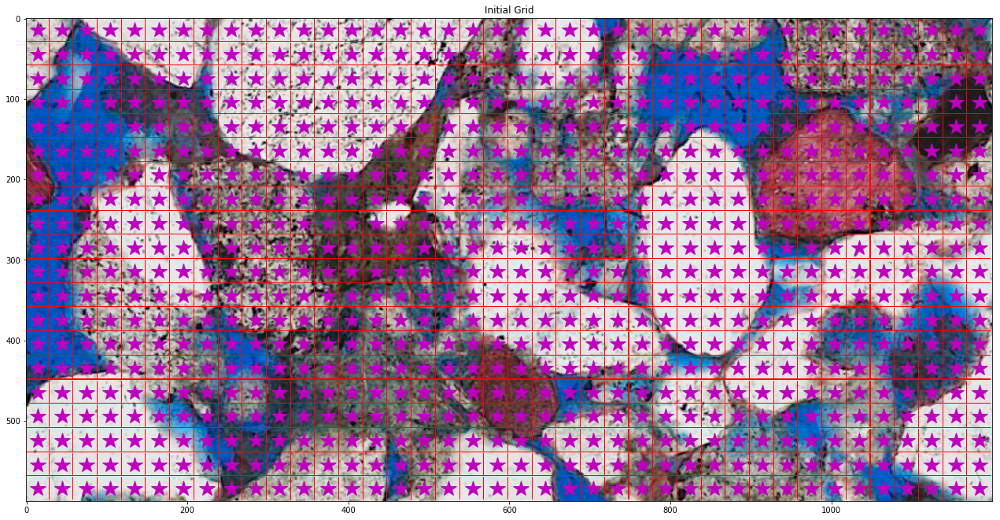

In [0]:
# setup
set_seed(10)

from kmeans_local import kmeans_local

# grid = [int(1200/30), int(600/30)]
grid = [40, 40]

img_white = get_img("images/TX1_white_cropped.tif")
obj_white = kmeans_local(img_white, grid)

img_polar = get_img("images/TX1_polarised_cropped.tif")
obj_polar = kmeans_local(img_polar, grid)

# plot the initial binning 
obj_white.plot("setup")
plt.gca().set(title='Initial Grid')

multi_obj = MSLIC_wrapper([obj_white, obj_polar])

# iterate
multi_obj.iterate(2)

# plot
multi_obj.plot([0,1])

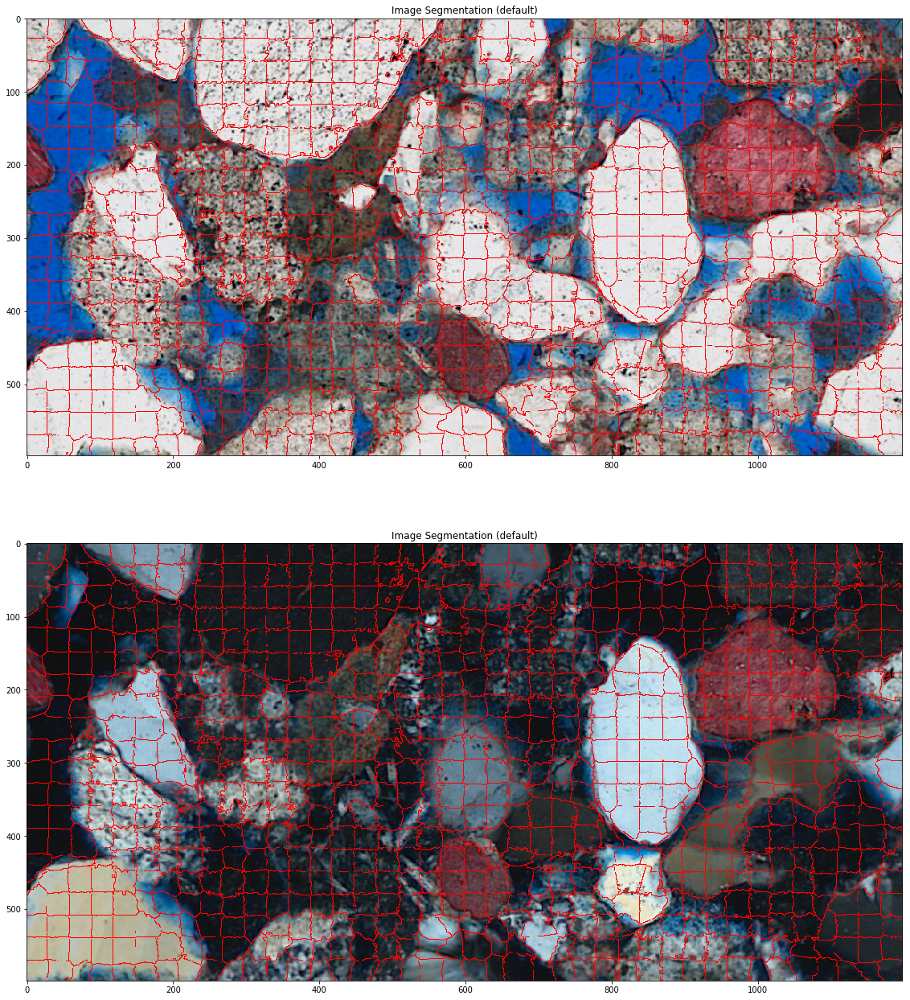

In [0]:
multi_obj.plot([0,1])

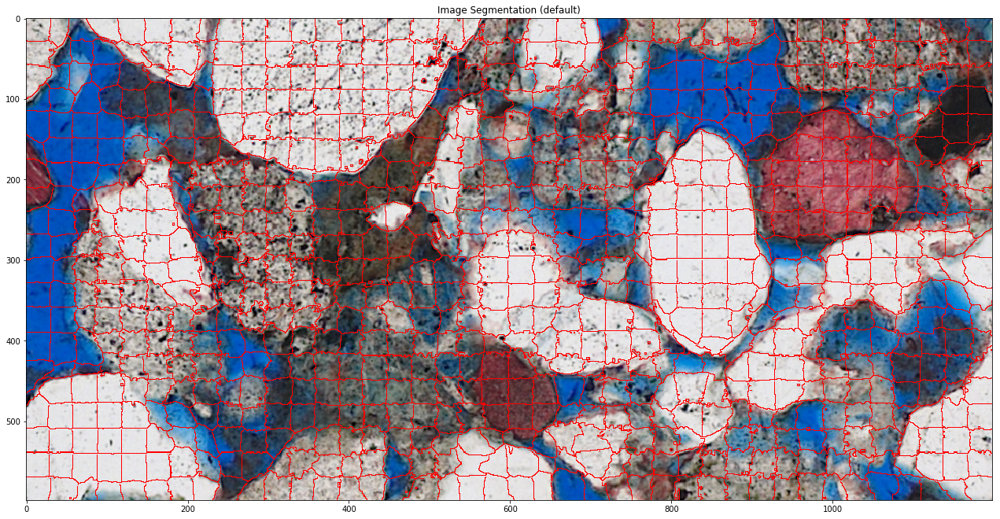

In [0]:
multi_obj.plot([0])

## Misc Space